# Рынок заведений общественного питания Москвы

### Описание проекта:

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


### Описание данных:

Файл moscow_places.csv:

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки)

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест.

### Загрузим данные и изучим общую информацию

In [1]:
import pandas as pd   #импортируем библиотеки
import datetime as dt
import seaborn as sns
import numpy as np
from scipy import stats as st
import math as mth
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import warnings
from plotly import graph_objects as go
plt.style.use ('seaborn-deep')
import plotly.express as px
from numpy import median
from numpy import mean
# конвертеры, которые позволяют использовать типы pandas в matplotlib  
register_matplotlib_converters()
from folium import Map, Choropleth, Marker
import json
from folium.plugins import MarkerCluster

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.info() #ознакомимся с данными

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


***ВЫВОД: Значения в столбце seats необходимо перевести в формат целого числа int, по остальным столбцам тип данных соответствует. Всего в таблице представлено 8 406 заведений, в некоторых столбцах (hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats) есть пропуски, которые необходимо будет обработать.***

### Выполняем предобработку данных

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.duplicated().sum() #проверка дубликатов

0

***ВЫВОД: Дубликаты не обнаружены.***

In [6]:
x = data.isna().sum().to_frame()
#количество пропущенных значений в столбцах
x

,0
name,0
category,0
address,0
district,0
hours,536
lat,0
lng,0
rating,0
price,5091
avg_bill,4590


In [7]:
x ['per'] = (100/8406)*x[0]
x

,0,per
name,0,0.000000
category,0,0.000000
address,0,0.000000
district,0,0.000000
hours,536,6.376398
lat,0,0.000000
lng,0,0.000000
rating,0,0.000000
price,5091,60.563883
avg_bill,4590,54.603854


In [8]:
data.describe().T #посмотрим на средние, минимальные и максимальные значения для поиска аномалий

,count,mean,std,min,25%,50%,75%,max
lat,8406.0,55.750109,0.069658,55.573942,55.705155,55.753425,55.795041,55.928943
lng,8406.0,37.608570,0.098597,37.355651,37.538583,37.605246,37.664792,37.874466
rating,8406.0,4.229895,0.470348,1.000000,4.100000,4.300000,4.400000,5.000000
middle_avg_bill,3149.0,958.053668,1009.732845,0.000000,375.000000,750.000000,1250.000000,35000.000000
middle_coffee_cup,535.0,174.721495,88.951103,60.000000,124.500000,169.000000,225.000000,1568.000000
chain,8406.0,0.381275,0.485729,0.000000,0.000000,0.000000,1.000000,1.000000
seats,4795.0,108.421689,122.833396,0.000000,40.000000,75.000000,140.000000,1288.000000


In [9]:
data.query('seats <= 700') #посмотрим на выбросы по столбцу seats

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [10]:
data.groupby('category').agg({'seats': 'median'}).sort_values(by = 'seats', ascending = False)

,seats
category,
ресторан,86.0
"бар,паб",82.5
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


In [11]:
for d in data['category'].unique(): 
    data.loc[(data['category'] == d) & (data['seats'].isna()), 'seats'] = \
   data.loc[(data['category'] == d), 'seats'].median() #заменили пропуски в стоблце  seats на медианные значения соответствующей категории (кафе, ресторан, пиццерия)

***ВЫВОД: Заполнили пропуски медианным значением, так как среднее значение не подойдет, есть большие ТЦ с огромным количеством посадочных мест всего ТЦ, заполнение пропусков по среднему значению, будет не совсем объективным заполнением пропусков.***

In [12]:
data['seats'] = data['seats'].astype('int64') #изменили тип данных на целочисленный

In [13]:
data = data.dropna(subset=['hours']) #пропуски в столбце hours составляют всего 6% можем удалить их

***ВЫВОД: Остальные пропуски не будем заполнять, оставим, как есть, так как заполнять по среднему или медианному значению в данном случае не совсем корректно.***

***4.2 Создайте столбец street с названиями улиц из столбца с адресом***

In [14]:
data ['street'] = data ['address'].str.split(',').str[1] #создаем столбец с названием улицы

***4.3 Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.***

In [15]:
data['is_24'] = data['hours'].apply(lambda x: 'True' if x == 'ежедневно, круглосуточно' else 'False') #создаем столбец режим работы заведения

In [16]:
data['hours'].str.contains('ежедневно, круглосуточно')

0       False
1       False
2       False
3       False
4       False
        ...  
8401    False
8402    False
8403     True
8404     True
8405     True
Name: hours, Length: 7870, dtype: bool

In [17]:
data.head(30) #проверка, что столбцы создались

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,60,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,80,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,55,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65,Ангарская улица,False


### Анализ данных

5.1 Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [18]:
data.groupby('category').agg({'name': 'count'}).sort_values(by = 'name', ascending = False)

,name
category,
кафе,2003
ресторан,1969
кофейня,1398
"бар,паб",747
пиццерия,628
быстрое питание,570
столовая,306
булочная,249


In [19]:
name_rest = ['бар,паб', 'булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая']
values = [747, 249, 570, 2003, 1398, 628, 1969, 306]

fig = go.Figure(data=[go.Pie(labels=name_rest, values=values)], layout_title_text='Распределение категорий заведений Москвы')

fig.show() 

***ВЫВОД: Наибольший процент заведений в Москве составляют кафе и рестораны по 25% и 17% относится к кофейням, остальная часть заведений относится к менее крупным заведениеям типа бар/паб, пиццерия, быстрое питание, столовые и булочные составляют наименьшее количество.***

5.2 Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

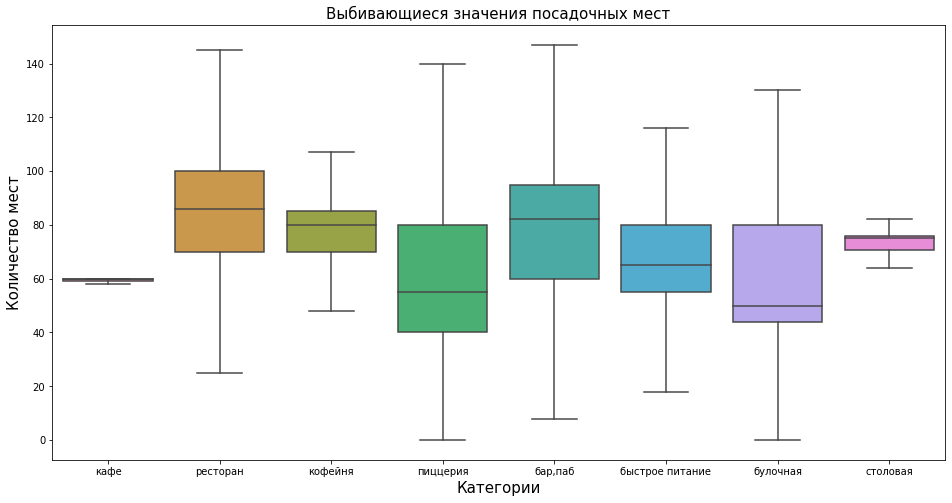

In [20]:
plt.figure(figsize=(16,8))
ax=sns.boxplot (x = 'category', y = 'seats', data = data, showfliers=False)
ax.axes.set_title("Выбивающиеся значения посадочных мест", fontsize=15)
ax.set_xlabel("Категории", fontsize=15)
ax.set_ylabel("Количество мест", fontsize=15);#проверим выбросы

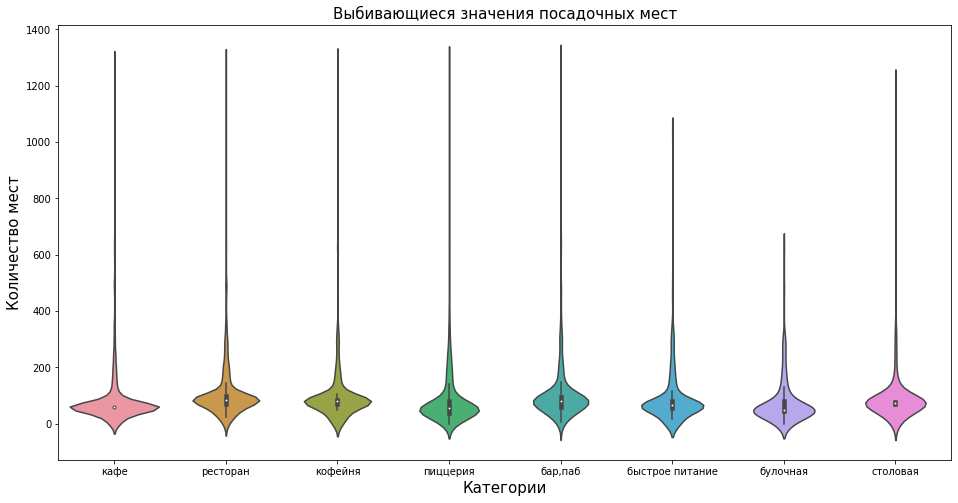

In [21]:
plt.figure(figsize=(16,8))
ax = sns.violinplot (x = 'category', y = 'seats', data = data); 
ax.axes.set_title("Выбивающиеся значения посадочных мест", fontsize=15)
ax.set_xlabel("Категории", fontsize=15)
ax.set_ylabel("Количество мест", fontsize=15);#проверим выбросы

***ВЫВОД: В данных есть ТЦ, в которых количество мест указано всего фудкорта, предлагаю, указанные данные свыше 200 посадочных мест отбросить и не учитывать в расчете.***

In [22]:
new_data = data.query('seats <= 200')
new_data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,60,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,80,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150,Люблинская улица,True


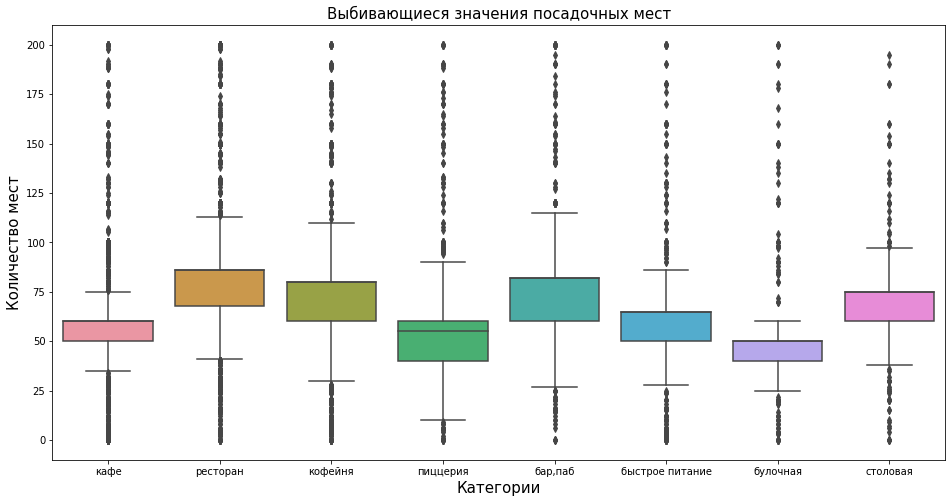

In [23]:
plt.figure(figsize=(16,8))
ax=sns.boxplot (x = 'category', y = 'seats', data = new_data)
ax.axes.set_title("Выбивающиеся значения посадочных мест", fontsize=15)
ax.set_xlabel("Категории", fontsize=15)
ax.set_ylabel("Количество мест", fontsize=15);#проверим выбросы по отфильтрованным данным

In [24]:
cat = new_data.groupby('category', as_index= False).agg({'seats': 'median'}).sort_values(by = 'seats', ascending = False)
cat #сгруппируем данные по категориям

,category,seats
6,ресторан,86
0,"бар,паб",82
4,кофейня,80
7,столовая,75
2,быстрое питание,65
3,кафе,60
5,пиццерия,55
1,булочная,50


In [25]:
import numpy as np

def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center") 
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

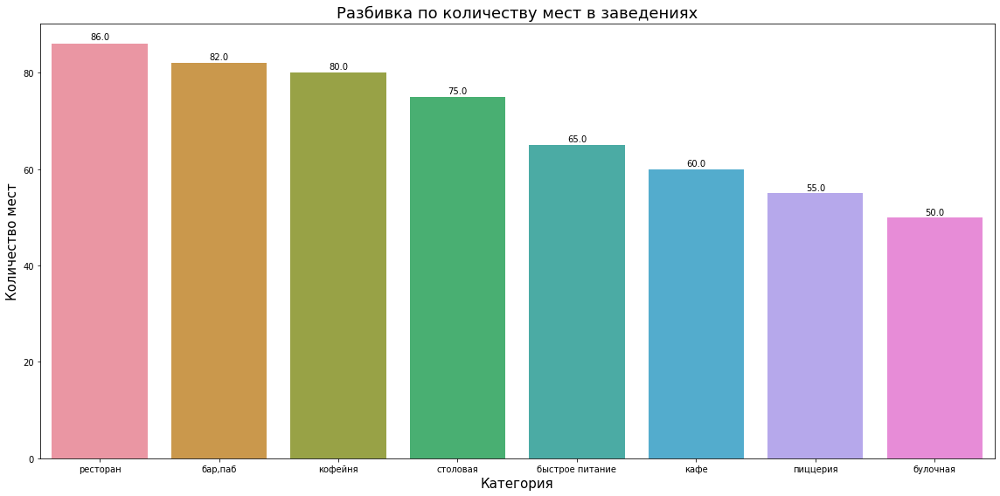

In [26]:
plt.figure(figsize=(16,8)) #построим столбчатую диаграмму

ax = sns.barplot(x='category', 
           y='seats', 
           data=cat)

show_values(ax)


plt.xlabel('Категория', size=15)
plt.ylabel('Количество мест', size=15)
plt.title('Разбивка по количеству мест в заведениях', size=18)
plt.tight_layout()

***ВЫВОД: После фильтрации данных по количеству мест (менее 200) наибольшее количество мест в ресторанах, далее бары/пабы, кофейни и столовые, остальные заведение примерно на одном уровне.***

In [27]:
cat = new_data.groupby('category', as_index= False).agg({'seats': 'median'})
cat #сгруппируем данные по категориям

,category,seats
0,"бар,паб",82
1,булочная,50
2,быстрое питание,65
3,кафе,60
4,кофейня,80
5,пиццерия,55
6,ресторан,86
7,столовая,75


In [28]:
cat = cat.sort_values(by='seats', ascending=False)

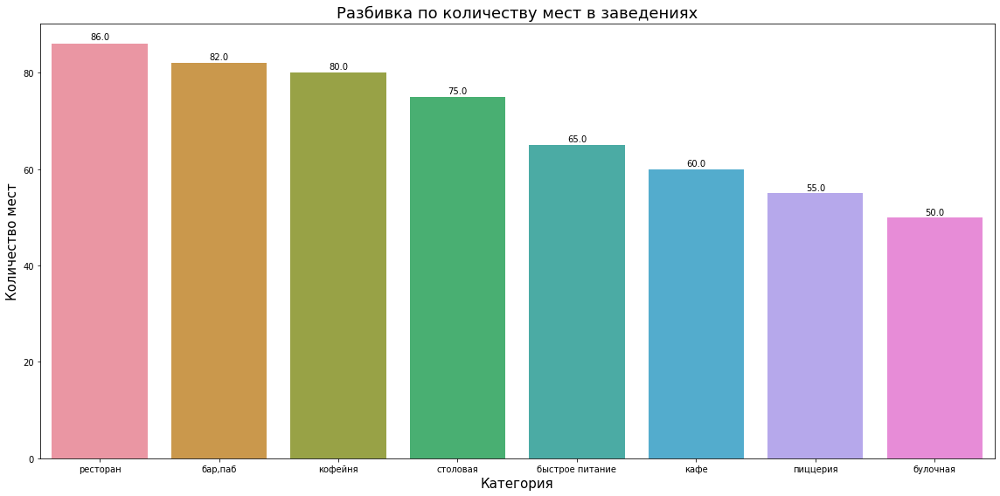

In [29]:
plt.figure(figsize=(16,8)) #построим столбчатую диаграмму

ax = sns.barplot(x='category', 
           y='seats', 
           data=cat)

show_values(ax)


plt.xlabel('Категория', size=15)
plt.ylabel('Количество мест', size=15)
plt.title('Разбивка по количеству мест в заведениях', size=18)
plt.tight_layout()



5.3 Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [30]:
chain_pl = data.groupby('chain', as_index= False).agg({'name': 'count'}).sort_values(by = 'name', ascending = False)
chain_pl ['per'] =  (chain_pl['name']/data['name'].count()).round(2)
chain_pl

,chain,name,per
0,0,4781,0.61
1,1,3089,0.39


In [31]:
chain_pl = ['сетевое заведение', 'несетевое заведение']
values = [4781, 3089]

fig = go.Figure(data=[go.Pie(labels=chain_pl, values=values)], layout_title_text='Распределение сетевых и несетевых заведений Москвы')
fig.show()

***ВЫВОД: Большая часть заведений Москвы сетевые заведения 60,7 %, остальные 39,3 % относятся к несетевым.***

5.4 Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [32]:
chain_place = data.query('chain == 1') #отфильтруем сетевые заведения

In [33]:
cat = chain_place.groupby('category', as_index= False).agg({'name': 'count'}).sort_values(by = 'name', ascending = False)
cat

,category,name
4,кофейня,714
6,ресторан,712
3,кафе,711
5,пиццерия,330
2,быстрое питание,224
0,"бар,паб",159
1,булочная,154
7,столовая,85


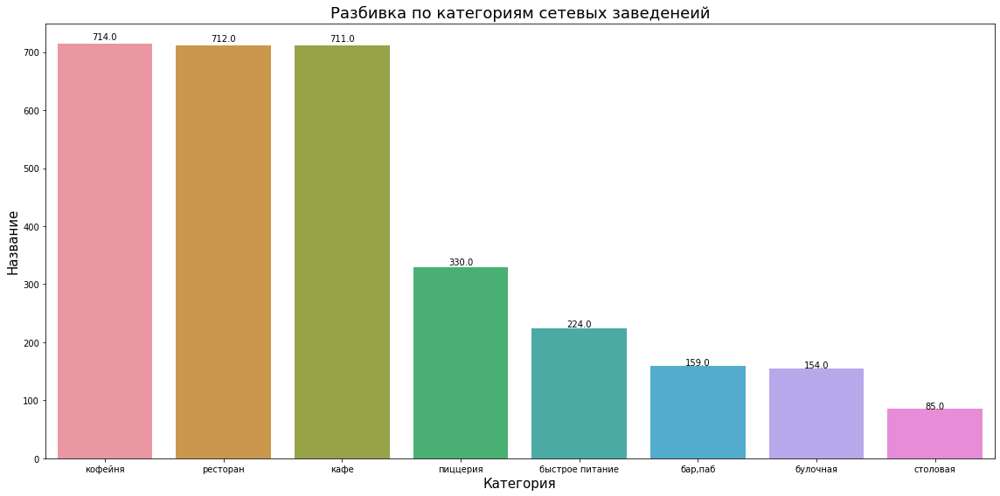

In [34]:
plt.figure(figsize=(16,8)) #построим столбчатую диаграмму

ax = sns.barplot(x='category', 
           y='name', 
           data=cat)

show_values(ax)

plt.xlabel('Категория', size=15)
plt.ylabel('Название', size=15)
plt.title('Разбивка по категориям сетевых заведенеий', size=18)
plt.tight_layout()

***ВЫВОД: Наибольшее количество сетевых заведений относится к кофейням, ресторанам и кафе, что вполне логично и объяснимо, более масштабные и с большим капиталов заведения, могут быть сетевыми, наименьшее количество сетевых заведений столовые и булочные.***

5.5 Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [35]:
data_chain = data.query('chain == 1') #срез сетевых заведений

In [36]:
a = data_chain.groupby(['name','category'], as_index = False).agg(count = ('name','count')).sort_values(by='count', ascending = False)
a.head(15) #топ-15 популярных сетей в МСК

,name,category,count
1106,Шоколадница,кофейня,119
489,Домино'с Пицца,пиццерия,76
484,Додо Пицца,пиццерия,74
202,One Price Coffee,кофейня,71
1122,Яндекс Лавка,ресторан,68
72,Cofix,кофейня,65
238,Prime,ресторан,49
543,КОФЕПОРТ,кофейня,42
625,Кулинарная лавка братьев Караваевых,кафе,39
946,Теремок,ресторан,36


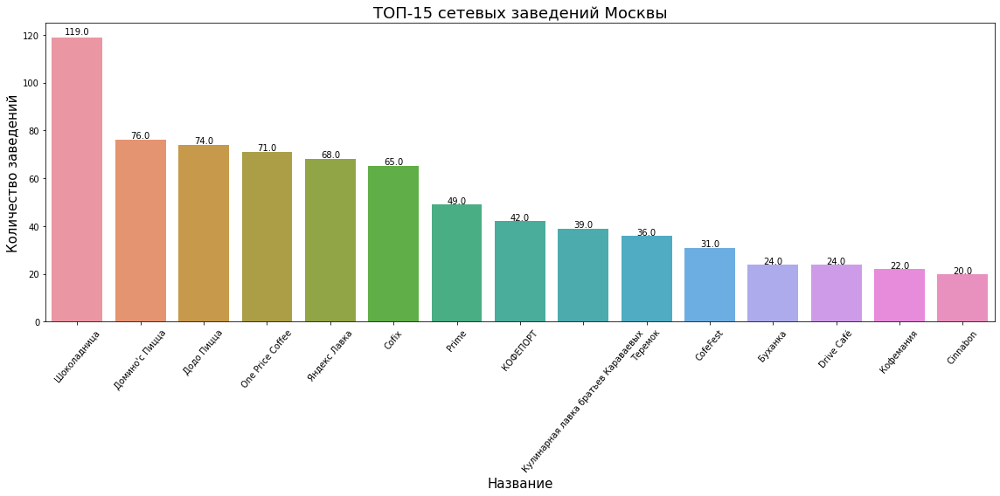

In [37]:
plt.figure(figsize=(16,8)) #построим столбчатую диаграмму

ax = sns.barplot(x='name', 
           y='count', 
           data=a.head(15))

show_values(ax)

plt.xlabel('Название', size=15)
plt.ylabel('Количество заведений', size=15)
plt.title('ТОП-15 сетевых заведений Москвы', size=18)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 50)
plt.tight_layout()

***ВЫВОД: Указанный топ-15 заведений относится в большинстве своем к кофейням. Смею предположить, объединяющим признаком являеся, что указанные сети межрегиональные и размещены в крупных ТЦ.***

In [38]:
fig = px.bar(a.head(15), x='name', y='count', color='category', title='ТОП-15 сетевых заведений Москвы')
fig.update_xaxes(tickangle=45)
fig.show() 

5.6 Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [39]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [40]:
b = data.groupby(['district','category'], as_index = False).agg(count = ('name','count')).sort_values(by='count', ascending = False)
b #выведем категории заведений, их количество по райнам Москвы

,district,category,count
46,Центральный административный округ,ресторан,665
43,Центральный административный округ,кафе,444
44,Центральный административный округ,кофейня,426
40,Центральный административный округ,"бар,паб",364
27,Северо-Восточный административный округ,кафе,229
...,...,...,...
1,Восточный административный округ,булочная,23
63,Юго-Западный административный округ,столовая,17
39,Северо-Западный административный округ,столовая,17
33,Северо-Западный административный округ,булочная,12


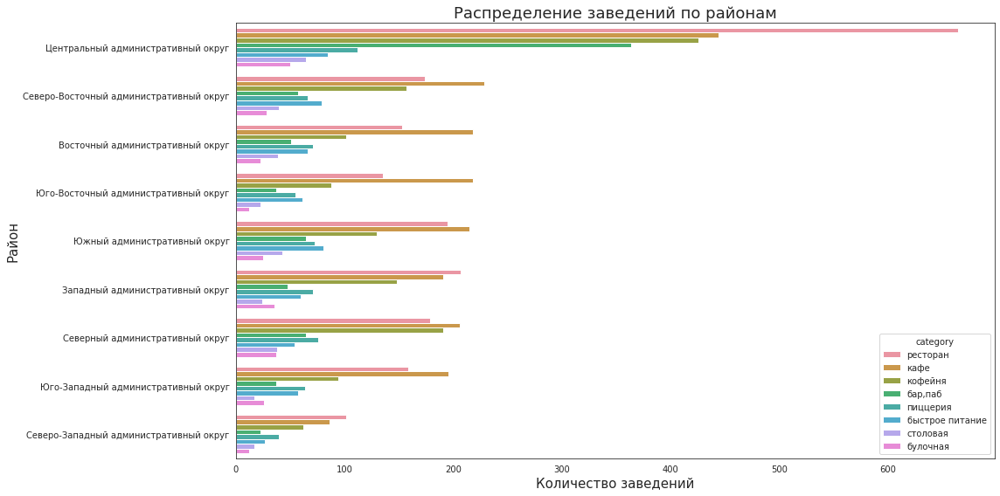

In [41]:
plt.figure(figsize=(16,8))
sns.set_style('white')
sns.barplot(x='count',y='district',hue = 'category',data = b)
plt.xlabel('Количество заведений', size=15)
plt.ylabel('Район', size=15)
plt.title('Распределение заведений по районам', size=18)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
plt.tight_layout()
plt.show()

***ВЫВОД: Наибольшее количество заведений сосредоточено в Центральном окргуе Москвы, по остальным районам распределение количества заведений схожее, наименьшее количество заведений в Северо-Западном административном округе. По распределению категорий кафе, рестораны и кофейни занимают почетные первые места.***

5.7 Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?


In [42]:
data_1 = data.sort_values(by = 'rating', ascending = False)
data_1

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,60,улица Дыбенко,False
1197,Маяк,ресторан,"Москва, улица Маршала Катукова, вл26А",Северо-Западный административный округ,"пн-пт 10:00–22:30; сб,вс 10:00–00:30",55.802202,37.420819,5.0,NaN,NaN,NaN,NaN,1,86,улица Маршала Катукова,False
1307,Nero Bean Coffee Roastery,кофейня,"Москва, Ленинградский проспект, 80, корп. 3",Северный административный округ,пн-пт 09:00–19:00,55.809720,37.507711,5.0,NaN,Цена чашки капучино:150–250 ₽,NaN,200.0,0,232,Ленинградский проспект,False
6865,"Пироги по-домашнему, Халяль",быстрое питание,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.669739,37.553128,5.0,средние,NaN,NaN,NaN,0,86,Профсоюзная улица,False
1296,Bread Head,кофейня,"Москва, бульвар Генерала Карбышева, 15",Северо-Западный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–22:00",55.781952,37.470147,5.0,NaN,NaN,NaN,NaN,0,80,бульвар Генерала Карбышева,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1125,На мангале,кафе,"Москва, проспект Мира, 119, стр. 503",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.830405,37.617687,1.0,высокие,Средний счёт:4000–5000 ₽,4500.0,NaN,0,60,проспект Мира,False
4222,Сетунь,ресторан,"Москва, 1-й Сетуньский проезд, 10с1",Западный административный округ,"ежедневно, 11:00–23:00",55.733738,37.536305,1.0,NaN,NaN,NaN,NaN,0,86,1-й Сетуньский проезд,False
7629,Pho Street,кафе,"Москва, Новоясеневский проспект, 11",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.606584,37.536446,1.0,NaN,NaN,NaN,NaN,1,70,Новоясеневский проспект,False
6757,Омореморе,ресторан,"Москва, Ленинский проспект, 108, стр. 1",Западный административный округ,"ежедневно, 09:00–23:00",55.669702,37.512464,1.0,NaN,NaN,NaN,NaN,1,290,Ленинский проспект,False


In [43]:
f = data.groupby(['category'], as_index = False).agg(count = ('rating','mean')).sort_values(by='count', ascending = False)
f

,category,count
0,"бар,паб",4.394511
5,пиццерия,4.301433
6,ресторан,4.296140
1,булочная,4.276707
4,кофейня,4.275036
7,столовая,4.217320
3,кафе,4.150325
2,быстрое питание,4.058947


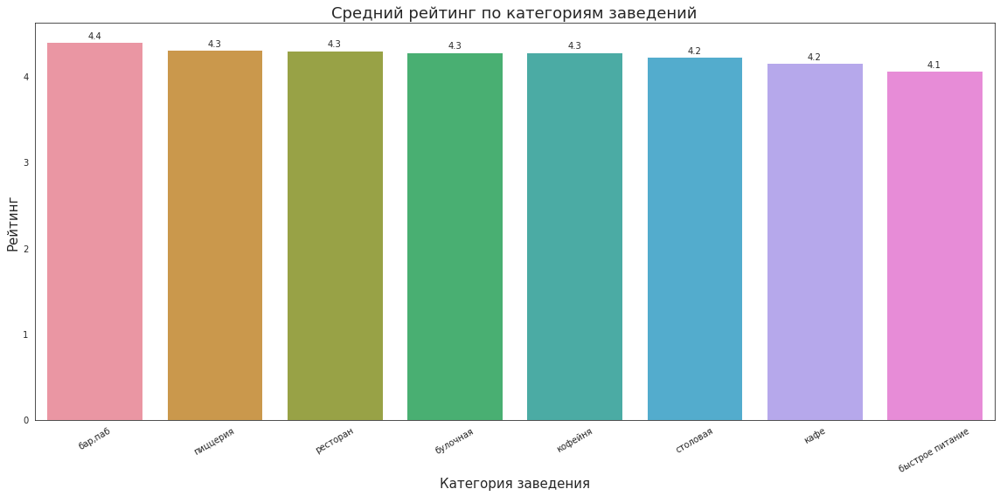

In [44]:
plt.figure(figsize=(16,8))
ax = sns.barplot (x = 'category', y = 'count', data = f, estimator = mean)
show_values(ax)
plt.xlabel('Категория заведения', size=15)
plt.ylabel('Рейтинг', size=15)
plt.title('Средний рейтинг по категориям заведений', size=18)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
plt.tight_layout()
plt.show()

***ВЫВОД: Средний рейтинг по категориям заведений очень похож в районе 4 баллов, немного меньше рейтинг у категории быстрое питание.***

5.8 Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [45]:
rating_data = data.groupby('district', as_index = False)['rating'].agg('mean').sort_values (by='rating', ascending = False)
rating_data

,district,rating
5,Центральный административный округ,4.379285
2,Северный административный округ,4.253664
4,Северо-Западный административный округ,4.237398
1,Западный административный округ,4.194140
7,Юго-Западный административный округ,4.191077
0,Восточный административный округ,4.189212
8,Южный административный округ,4.188634
3,Северо-Восточный административный округ,4.160602
6,Юго-Восточный административный округ,4.124324


In [46]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [47]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

***ВЫВОД: Наивысший рейтинг заведений сосредоточен в центре Москвы, там расположены заведения с рейтингом 4.38, также стоит отметить Северный и Северо-Западный районы Москвы, где рейтинг заведений также на высоком уровне, наименьший рейтинг у заведений на Северо-Востоке и Юго-Встоке Москвы.***

5.9 Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [48]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

5.10 Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [49]:
street_top_15 = data.groupby(['street','category'], as_index = False)['name'].agg('count').sort_values (by='name', ascending = False)

In [50]:
top_streets_ = street_top_15.head(15)['street'].unique()

In [51]:
data.loc[data['street'].isin(top_streets_)].pivot_table(
    index=['street', 'category'],
    values='address',
    aggfunc='count',
).sort_values(by='address', ascending = False)

address
street                category         
 проспект Мира        кафе           49
                      ресторан       43
                      кофейня        35
 МКАД                 кафе           33
 проспект Вернадского ресторан       31
...                                 ...
 Люблинская улица     столовая        2
 проспект Мира        столовая        2
 проспект Вернадского булочная        1
 Люблинская улица     пиццерия        1
 МКАД                 столовая        1

[68 rows x 1 columns]

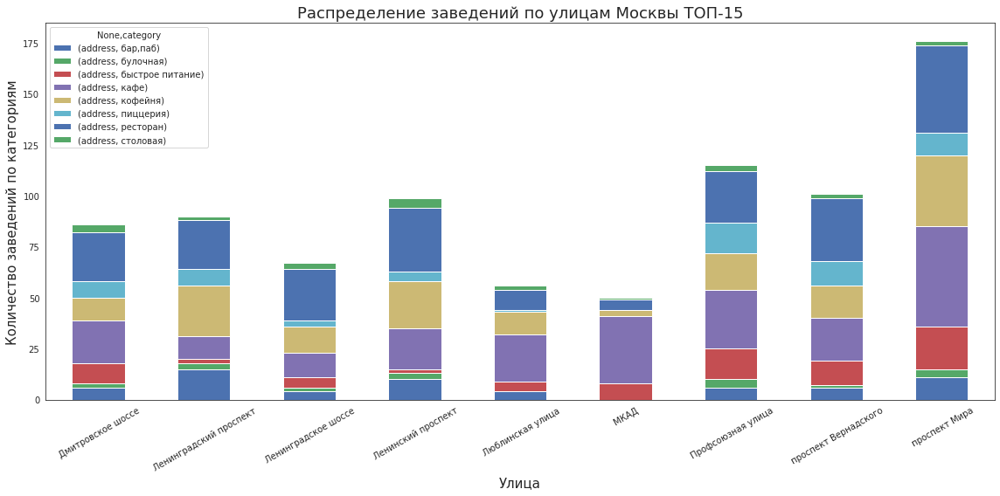

In [52]:
ax = data.loc[data['street'].isin(top_streets_)].pivot_table(
    index=['street', 'category'],
    values='address',
    aggfunc='count',
).unstack().plot.bar(stacked=True, figsize=(16,8))

ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
plt.xlabel('Улица', size=15)
plt.ylabel('Количество заведений по категориям', size=15)
plt.title('Распределение заведений по улицам Москвы ТОП-15', size=18)
plt.tight_layout()
plt.show()

In [53]:
top_streets_ = street_top_15.head(15)['street'].unique()

In [54]:
data.loc[data['street'].isin(top_streets_)].pivot_table(
    index=['street', 'category'],
    values='address',
    aggfunc='count',
)

address
street             category                
 Дмитровское шоссе бар,паб                6
                   булочная               2
                   быстрое питание       10
                   кафе                  21
                   кофейня               11
...                                     ...
 проспект Мира     кафе                  49
                   кофейня               35
                   пиццерия              11
                   ресторан              43
                   столовая               2

[68 rows x 1 columns]

<AxesSubplot:xlabel='street'>

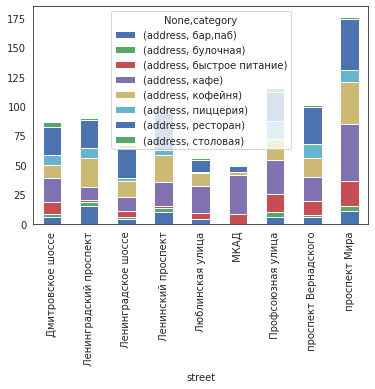

In [55]:
data.loc[data['street'].isin(top_streets_)].pivot_table(
    index=['street', 'category'],
    values='address',
    aggfunc='count',
).unstack().plot.bar(stacked=True)

***ВЫВОД: Наибольшее количество заведений расположено на проспекте Мира в Москве (рестораны, кафе, кофейни, быстрое питание) почти все категории, относится к центральному округу. Далее по количеству завдений проспект Вернандского с распределением по категориям заведений рестораны/кафе и Профсоюзная улица с похожим распределением заведений. Ленинский проспект также относится к ТОП-15 улиц с распределением заведений рестораны и кофейни.***

5.11 Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [56]:
no_popular = data.groupby(['street','category'], as_index = False)['name'].agg('count').sort_values (by='name', ascending = False)
no_popular.tail(15)

,street,category,name
1468,Молодогвардейская улица,булочная,1
1469,Молодогвардейская улица,кафе,1
1470,Молодогвардейская улица,кофейня,1
1471,Молодогвардейская улица,пиццерия,1
1474,Молодёжная улица,кофейня,1
1487,Моховая улица,"бар,паб",1
1476,Монтажная улица,кофейня,1
1477,Монтажная улица,ресторан,1
1478,Москворецкая набережная,кофейня,1
1479,Московская улица,кафе,1


In [57]:
pivot_2 = pd.pivot_table(data=no_popular.tail(10), index=['street'], columns=['category'], values='name')
pivot_2

category,"бар,паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,
Монтажная улица,NaN,NaN,NaN,1.0,NaN,1.0,NaN
Москворецкая набережная,NaN,NaN,NaN,1.0,NaN,NaN,NaN
Московская улица,NaN,NaN,1.0,NaN,NaN,NaN,NaN
Московский проспект,NaN,NaN,NaN,NaN,1.0,NaN,NaN
Мосфильмовская улица,NaN,1.0,1.0,NaN,NaN,NaN,1.0
Моховая улица,1.0,NaN,NaN,NaN,NaN,NaN,NaN
Подъёмная улица,NaN,NaN,NaN,NaN,NaN,NaN,1.0


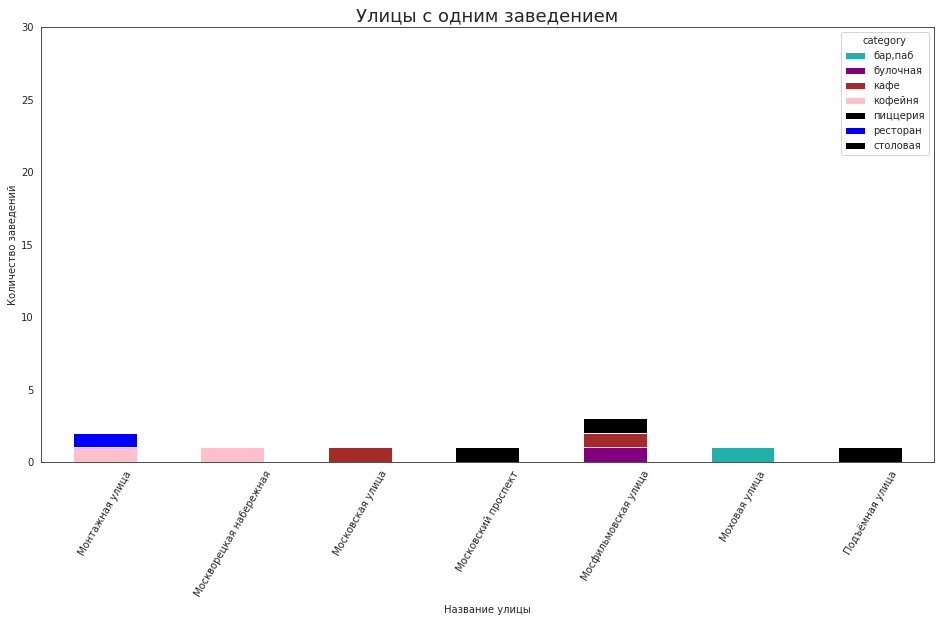

In [58]:
ax = pivot_2.plot.bar(stacked=True, color =['lightseagreen', 'purple', 'brown', 'pink', 'black', 'blue', 'black'], figsize=(16,8))
ax.set_title('Улицы с одним заведением', fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 60)
ax.set_ylim(0,30)
plt.xlabel('Название улицы', size=10)
plt.ylabel('Количество заведений', size=10)
plt.show()

***ВЫВОД: на улицах  Подъемной, Московской находятся за вторым кольцом, есть предположение, что по этой причине заведений всего 1 шт на улицу, нет особого спроса.
на двух остальных Московский проспект, Москворецкаяб Моховой набережная расположены в центре Москвы, возможно по размеру улицы небольшие. Полагаю заведения с доступными ценами (пиццерия, столовая, кафе)***

5.12 Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [59]:
avr_bill =  data.groupby('district', as_index = False)['middle_avg_bill'].agg('mean').sort_values (by='middle_avg_bill', ascending = False)
avr_bill

,district,middle_avg_bill
5,Центральный административный округ,1190.559130
1,Западный административный округ,1053.072131
2,Северный административный округ,927.959627
8,Южный административный округ,836.301282
4,Северо-Западный административный округ,822.222930
0,Восточный административный округ,820.626923
7,Юго-Западный административный округ,792.561702
3,Северо-Восточный административный округ,716.611296
6,Юго-Восточный административный округ,654.097938


In [60]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [61]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avr_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний чек в заведениях по районам',
).add_to(m)

# выводим карту
m

***ВЫВОД: Наибольший средний чек находится в Центральном районе Москвы, также стоит отметить повышенный средний в районе рублевского шоссе. Стоимость среднего чека уменьшается в зависимость от удаленности от центра Москвы.***

5.13 Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

***Проанализируем другие признаки***

In [62]:
good_place = new_data.query('rating != 0')  # исключили заведения с нулевым рейтингом
good_place

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,60,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,80,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150,Люблинская улица,True


<Figure size 1152x576 with 0 Axes>

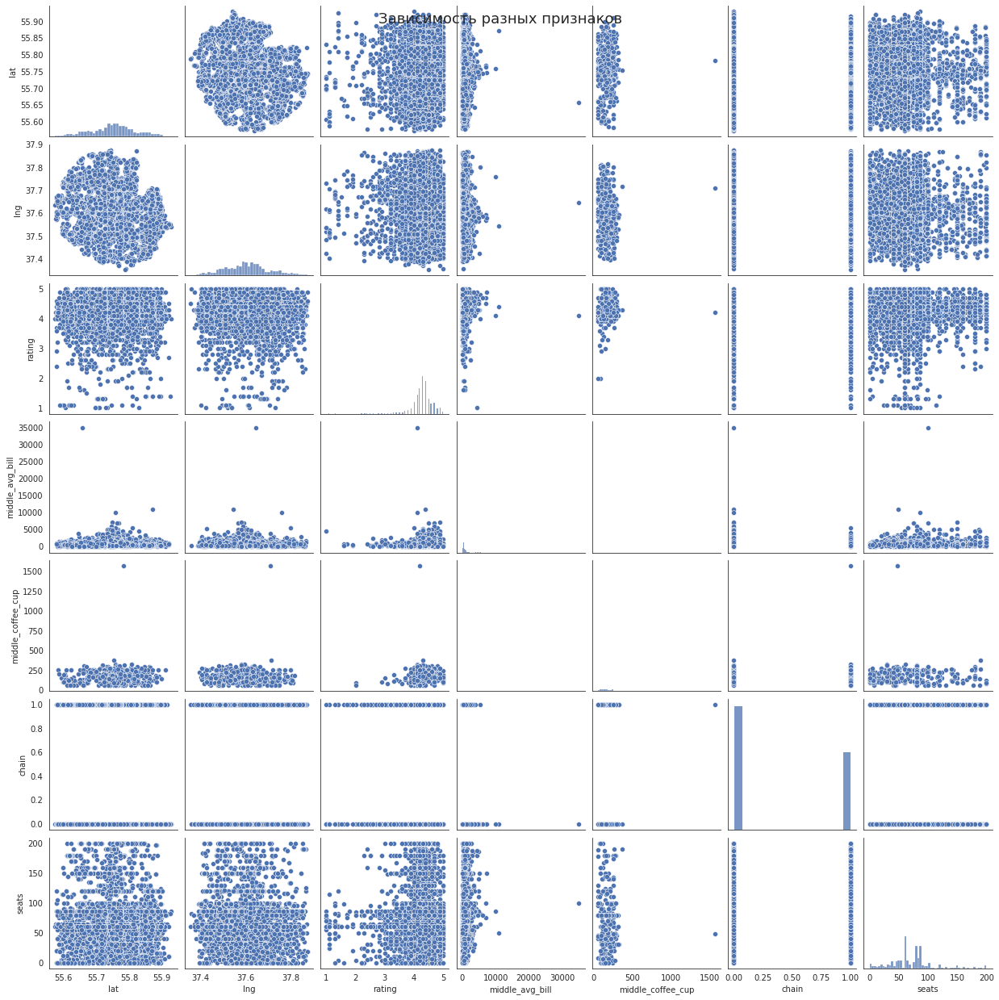

In [63]:
plt.figure(figsize=(16,8))
sns.pairplot(good_place)
plt.suptitle ('Зависимость разных признаков', size=18); #проанализировать иные зависимости (рейтинг-сеть, стоимость чашки кофе и расположение, кол-во мест/рейтинг)

***ВЫВОД
Исходя из графиков выше можно сделать вывод:***

- Рейтинг увеличивается с уменьшением количества мест в заведении
- Рейтинг заведения не зависит от сетевое заведение или несетевое
- Рейтинг заведения увеличивается в заведениях со средним чеком ококло 5 тыс рублей
- Высокий рейтинг в заведениях со стоимостью чашки кофе от 100-250 рублей

5.14 Соберите наблюдения по вопросам выше в один общий вывод.

***ОБЩИЙ ВЫВОД:***

Всего в данных представлено 8406 заведения, большую долю заведений Москвы составляют кафе, рестораны и кофейни, которые относятся в большей степени к сетевым заведениям более 60%. Наименьшее количество сетевых заведений размещены в категории столовые и булочные. К ТОП-15 сетевым заведениям Москвы относятся: Шоколадница, Cofix, Додо пицца, Доминос пицца, One price coffee и другие, указанный топ-15 заведений относится в большинстве своем к кофейням и пиццериям. Смею предположить, объединяющим признаком является, что указанные сети межрегиональные и размещены в крупных ТЦ, а также относятся к доступной ценовой категории.

Наибольшее количество заведений сосредоточено в Центральном округе Москвы, по остальным районам распределение количества заведений схожее, наименьшее количество заведений в Северо-Западном административном округе. По распределению категорий кафе, рестораны и кофейни занимают почетные первые места. 

Средний рейтинг заведений по категориям сосредоточен в районе 4 баллов, наименьший рейтинг в категории быстрое питание. Наивысший рейтинг заведений сосредоточен в центре Москвы, там расположены заведения с рейтингом 4.38, также стоит отметить Северный и Северо-Западный районы Москвы, где рейтинг заведений также на высоком уровне, наименьший рейтинг у заведений на Северо-Востоке и Юго-Встоке Москвы.

Наибольшее количество заведений расположено на проспекте Мира (один из самых больших проспектов) в Москве (рестораны, кафе, кофейни, быстрое питание) почти все категории, относится к центральному округу. Далее по количеству заведений проспект Вернандского (рядом расположен университет) с распределением по категориям заведений рестораны/кафе и Профсоюзная улица с похожим распределением заведений. Ленинский проспект также относится к ТОП-15 улиц с распределением заведений рестораны и кофейни. 

На улицах  Подъемной, Московской находятся за вторым кольцом, есть предположение, что по этой причине заведений всего 1 шт на улицу, нет особого спроса.
на двух остальных Московский проспект, Москворецкаяб Моховой набережная расположены в центре Москвы, возможно по размеру улицы небольшие. Полагаю заведения с доступными ценами (пиццерия, столовая, кафе) 

Наибольший средний чек находится в Центральном районе Москвы, также стоит отметить повышенный средний чек в районе рублевского шоссе. Стоимость среднего чека уменьшается в зависимости от удаленности от центра Москвы.

### Детализируем исследование: открытие кофейни

In [64]:
all_the_time=data.query('is_24 == "True" and category == "кофейня"') #сделаем срез кофейни, работающие круглосуточно
all_the_time['name'].count()

59

In [65]:
coffee = data.query('category == "кофейня"') #средний рейтинг кофейни
coffee['rating'].mean().round(2)

4.28

In [66]:
coffee.groupby('district')['rating'].mean().sort_values(ascending=False).to_frame() # средний рейтинг кофейни по округам Москвы

,rating
district,
Центральный административный округ,4.336150
Северо-Западный административный округ,4.325806
Северный административный округ,4.292147
Восточный административный округ,4.276471
Юго-Западный административный округ,4.274468
Южный административный округ,4.232308
Юго-Восточный административный округ,4.217045
Северо-Восточный административный округ,4.214013
Западный административный округ,4.191892


In [67]:
coffee_good_ch = coffee.query('rating>=4 and chain == 1 and middle_coffee_cup <= 450') #сделаем срез сетевых кофеен с рейтингом выше ии равно 4 баллам
coffee_good_ch

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
81,Coffee Way,кофейня,"Москва, Алтуфьевское шоссе, 86, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.897789,37.588189,4.3,NaN,Цена чашки капучино:120–170 ₽,NaN,145.0,1,120,Алтуфьевское шоссе,False
100,Take and Wake,кофейня,"Москва, Дмитровское шоссе, 100, стр. 2",Северный административный округ,пн-пт 08:30–18:30,55.882019,37.546174,4.5,низкие,Цена чашки капучино:150–210 ₽,NaN,180.0,1,120,Дмитровское шоссе,False
151,Шоколадница,кофейня,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.910447,37.542227,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,80,Дмитровское шоссе,False
240,Шоколадница,кофейня,"Москва, Широкая улица, 13А",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.887990,37.662485,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,75,Широкая улица,False
343,Шоколадница,кофейня,"Москва, Фестивальная улица, 13, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.855703,37.477670,4.3,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,100,Фестивальная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7702,Krispy Kreme,кофейня,"Москва, Кировоградская улица, 13А",Южный административный округ,"ежедневно, 10:00–22:00",55.611884,37.608123,4.3,NaN,Цена чашки капучино:205–280 ₽,NaN,242.0,1,250,Кировоградская улица,False
7807,I-cup,кофейня,"Москва, Шипиловский проезд, вл39с2",Южный административный округ,"ежедневно, 07:00–21:00",55.612696,37.695943,4.7,NaN,Цена чашки капучино:от 60 ₽,NaN,60.0,1,80,Шипиловский проезд,False
7897,Шоколадница,кофейня,"Москва, Ореховый бульвар, 14к3",Южный административный округ,"ежедневно, 10:00–22:00",55.609682,37.720095,4.2,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,80,Ореховый бульвар,False
7910,Cofix,кофейня,"Москва, Ореховый бульвар, 22А",Южный административный округ,"ежедневно, 09:00–22:00",55.612312,37.731524,4.2,NaN,Цена чашки капучино:от 60 ₽,NaN,60.0,1,80,Ореховый бульвар,False


In [68]:
y = coffee_good_ch.groupby('district', as_index = False)['middle_coffee_cup'].agg('median').sort_values (by='middle_coffee_cup', ascending = False)
y

,district,middle_coffee_cup
1,Западный административный округ,225.0
7,Юго-Западный административный округ,199.0
4,Северо-Западный административный округ,197.5
5,Центральный административный округ,180.0
3,Северо-Восточный административный округ,170.0
0,Восточный административный округ,150.0
2,Северный административный округ,140.0
6,Юго-Восточный административный округ,130.0
8,Южный административный округ,109.5


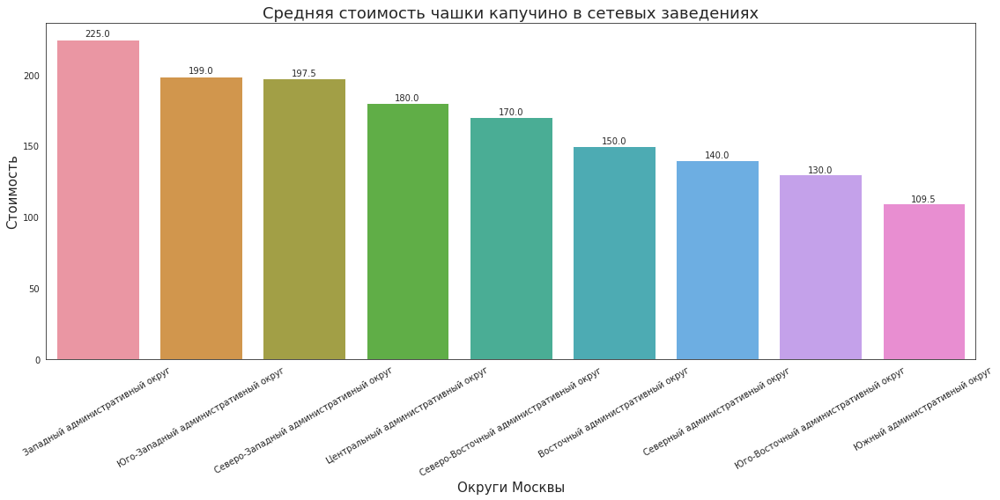

In [69]:
plt.figure(figsize=(16,8))
ax = sns.barplot (x = 'district', y = 'middle_coffee_cup', data = y)
show_values(ax)   
plt.xlabel('Округи Москвы', size=15)
plt.ylabel('Стоимость', size=15)
plt.title('Средняя стоимость чашки капучино в сетевых заведениях', size=18)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
plt.tight_layout()
plt.show()

In [70]:
coffee_good = coffee.query('rating>=4 and chain == 0') #сделаем срез несетевых кофеен с рейтингом выше ии равно 4 баллам

In [71]:
z = coffee_good.groupby('district', as_index = False)['middle_coffee_cup'].agg('median').sort_values (by='middle_coffee_cup', ascending = False) #сгруппируем по округам среднюю стоимость чашки капучино в несетевой кофейне
z

,district,middle_coffee_cup
7,Юго-Западный административный округ,197.0
5,Центральный административный округ,192.5
1,Западный административный округ,177.5
8,Южный административный округ,172.5
2,Северный административный округ,165.0
3,Северо-Восточный административный округ,165.0
4,Северо-Западный административный округ,165.0
6,Юго-Восточный административный округ,150.0
0,Восточный административный округ,135.0


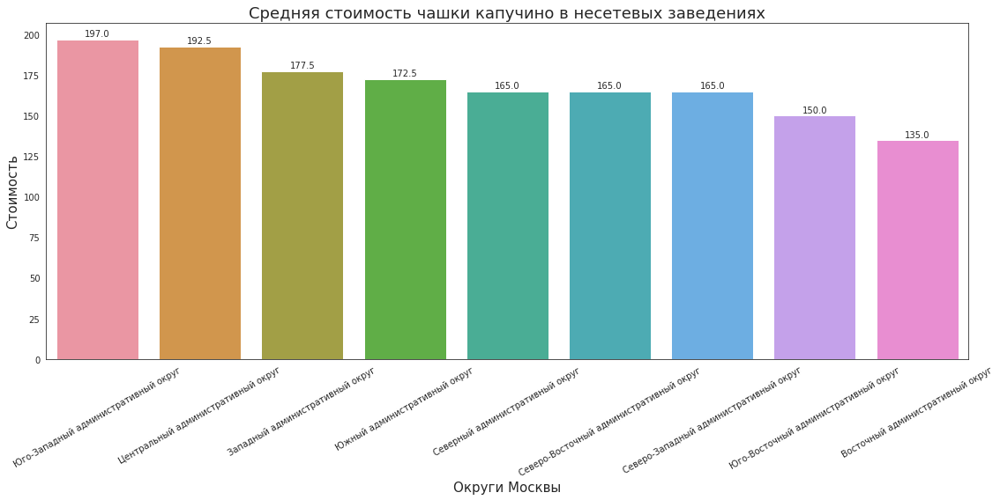

In [72]:
plt.figure(figsize=(16,8))
ax = sns.barplot (x = 'district', y = 'middle_coffee_cup', data = z)
show_values(ax)
plt.xlabel('Округи Москвы', size=15)
plt.ylabel('Стоимость', size=15)
plt.title('Средняя стоимость чашки капучино в несетевых заведениях', size=18)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
plt.tight_layout()
plt.show()

In [73]:
import numpy as np

def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center") 
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

6.1 Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
***В датасете представлено 1398 кофеен из них 714 сетевых заведений, больше всего кофеен расположено в Центральном, Северо-Вoсточном и Северном округах Москвы.***

- Есть ли круглосуточные кофейни?
***Да, в Москве есть 59 кофеен, работающих круглосуточно.***

- Какие у кофеен рейтинги? Как они распределяются по районам?
***Средний рейтинг кофеен 4.28 балла, наибольшее количетсво заведений с хорошим рейтингом расположено в Центральном и Северо-Западном округах Москвы.***

- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
***В зависимости от того, какое заведение будем открывать сетевое или несетевое, и в каком районе, будет зависеть и стоимость чашки капучино, например наибольшая медианная стоимость (использовали медианную стоиомсть так как в данных есть выбросы) в сетевом заведении с рейтингом от 4 баллов составляет 225 рублей за чашку в Западном округе Москвы, в Центральном районе стоимость капучино составит 180 рублей (у кофейни с рейтингом 4-5 баллов), если рассматривать заведение несетевое, то стоимость чашки капучино составит в Юго-Западном административном округе 197 рубля ( в кофейне с рейтингом выше 4 баллов), в Центральном районе 192 рублей (в кофейне с рейтингом более 4 баллов). На мой взгляд необходимо ориентироваться на заведения с хорошим рейтингом в популярных районах с наибольшим количеством кофеен.***


6.2 Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

***Исходя из вышепроведенного исследования и в дополнение ознакомившись с застройкой города Москва, я бы порекоммендовала, обратить внимание на новостройки и возможно, открыть одно из популярных категорий заведений: кофейню или кафе на первом этаже новостройки, воероятно, в будущем заведение перерастет в сетевое. 
Почему именно такое предложение, на мой вгляд оно является более перспективным и более востребованным, чем открывать заведение в центре Москвы, где есть сильные конкуренты и в первое время будет гораздо сложнее заслужить доверие посетителей. В перспекиве, рассмотреть и центральный округ Москвы, но когда заведение себя зарекомендует. 
По стоиомсти среднего чека стоит опираться на данные конкуретнов с высоким рейтингом в определенном регионе. Я бы предположила рассмотреть район Киевского шоссе, новостройки в этом районе средней ценовой категории и стоимость среднего чека заведения должна быть доступна для людей, заселяющиеся в дома в этом районе. 
Для начала бизнеса, на мой взгляд, район между Киевским и Симферпольским шоссе (перспективный в плане новостроек), а хорошая кофейня или кафе отличным дополнением новостройек и популярным местом у жителей района, также открывать бизнес гораздо проще, когда не такие сильные конкуренты вокруг по сравнению с Центральным округом Москвы.***

Презентация: https://drive.google.com/file/d/1er1os3CAQx7DIMBlNWiSyUTGApmxyClE/view?usp=sharing  